># **<center> AIRBNB LISTING BANGKOK </center>**


# Latar Belakang

Airbnb merupakan platform online untuk orang menyewa tempat tinggal sementara ketika berpergian ataupun berlibur melalui website atau aplikasi airbnb. Pengguna dapat menemukan berbagai jenis properti yang tersedia untuk di sewa, seperti rumah, apartemen, kamar pribadi, hotel, dan sebagainya.  

Walaupun banyak pilihan tempat tinggal yang tersedia, properti tersebut bukanlah milik airbnb sendiri. Melainkan airbnb adalah broker yang bekerjasama dengan pemilik properti untuk mengiklankan propertinya agar dengan mudah dijangkau oleh orang orang. Dengan begitu airbnb dapat memberikan manfaat pada pemilik properti dan penyewa.

Salah satu manfaatnya **pemilik properti dapat dengan mudah mendapatkan penyewa** dan airbnb akan mengambil komisi untuk jasanya disetiap pemesanan. Selain itu penyewa juga bisa memberikan **review pada properti yang disewa agar bisa menambah daya tarik properti** tersebut dan memikat calon penyewa selanjutnya. Dan review tersebut juga **menggambarkan popularitas dari properti karena semakin banyak review menandakan properti tersebut banyak disewa**.  

Sayangnya terdapat ketimpangan pada jumlah review properti yang terdaftar di airbnb bangkok. Sehingga tidak semua pemilik properti mendapat popularitas yang baik. Untuk itu diadakan analisis bagaimana cara meningkatkan review properti yang telah terdaftar di airbnb?


In [1]:
# df_clean['total_reviews'].describe()

## Pernyataan Masalah
Pada daftar properti yang telah terdaftar pada airbnb per tahun 2023, terdapat ketimpangan atas jumlah review yang diberikan oleh penyewa. hal ini ditunjukan dengan grafik berikut.

Dengan adanya permasalahan tersebut, sebagai seorang *data science*, kita akan membantu para pemilik properti yang telah terdaftar di airbnb ataupun pemilik properti yang berminat untuk bekerja sama dengan airbnb untuk **meningkatkan review properti di airbnb agar banyak penyewa yang menyewa properti mereka**, dengan menjawab pertanyaan berikut:

- **Bagaimana karakteristik properti yang telah direview di Bangkok?**
- **Bagaimana menentukan properti agar memungkinkan menjadi populer (banyak direview) di Bangkok?**

# Data
Untuk menjawab pertanyaan di atas, kita akan menganalisa data properti yang sudah terdaftar pada AirBNB listing Bangkok. Dataset dapat diakses [di sini](https://drive.google.com/drive/folders/1A_KBMRFTS5Mthpp46nulso679ML4ZwTF).  

Dataset terdiri dari 15854 data properti yang terdaftar pada AirBNB, dengan 13 variabel yang menjelaskan karakteristik properti tersebut.


# **Data Understanding untuk memahami tabel data pada AirBNB Bangkok**


| No. | Fitur | Deskripsi |
|-|-|-|
| 1. | **ID** | Identifikasi unik AirBNB untuk setiap listing. |
| 2. | **Name** | Nama Daftar. |
| 3. | **host_id** | ID Unik airBNB untuk setiap host/user. |
| 4. | **host_name** | nama Host/Nama depan. |
| 5. | **Neighborhood** | kode geografis lingkungan menggunakan garis lintang dan garis bujur terhadap lingkungan. |
| 6. | **Latitude** | Menggunakan proyeksi Sistem Geodesi Dunia (WGS84) untuk garis lintang.|
| 7. | **Longitude** |  Menggunakan proyeksi Sistem Geodesi Dunia (WGS84) untuk garis bujur.|
| 8. | **Room Type** | Tipe ruangan yang dimiliki oleh AirBNB Bangkok. |
| 9. | **Price** | Harga harian dalam mata uang lokal. Catatan, tanda $ dapat digunakan meskipun lokal. |
| 10. | **minimum_nights** | Jumlah minimum masa inap malam untuk listing (kalender aturan mungkin berbeda). |
| 11. | **number_of_reviews** | Jumlah ulasan yang dimiliki dalam daftar. |
| 12. | **availability_365** | Lama properti dapat dipesan dalam hari untuk pemesanan berikutnya  |
| 13. | **number_of_reviews_ltm** | Jumlah ulasan yang dimiliki listingan (dalam 12 bulan terakhir). |

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import normaltest, chi2_contingency, mannwhitneyu, ttest_ind
import missingno as ms
from wordcloud import WordCloud, STOPWORDS

In [3]:
df=pd.read_csv('Airbnb Listings Bangkok.csv')
display(df.head(),df.tail())

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15849,15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaN,NaN,1,362,0
15850,15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,NaN,NaN,14,365,0
15851,15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,NaN,NaN,14,365,0
15852,15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,NaN,NaN,14,365,0
15853,15853,790476492384199044,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.752960,100.540820,Private room,1214,1,0,NaN,NaN,14,365,0


## Data Understanding
Sebelum masuk ke dalam analisis, kita perlu mengenal dataset kita lebih jauh dalam tahapan *data understanding*. Dari proses ini, kita akan tahu anomali-anomali apa saja yang terdapat di dalam dataset kita dan perlu ditangani dalam tahapan *data cleaning*. Setiap penangan anomali yang dilakukan, akan disertai dengan justifikasi langkah yang diambil, baik secara *domain knowledge* maupun secara statistik.

Pertama, mari kita lihat informasi properti dari dataset airbnb listing.

In [4]:
print(f'Jumlah baris dan kolom di dataset df adalah {df.shape}')
df.info()

Jumlah baris dan kolom di dataset df adalah (15854, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Unnamed: 0                      15854 non-null  int64  
 1   id                              15854 non-null  int64  
 2   name                            15846 non-null  object 
 3   host_id                         15854 non-null  int64  
 4   host_name                       15853 non-null  object 
 5   neighbourhood                   15854 non-null  object 
 6   latitude                        15854 non-null  float64
 7   longitude                       15854 non-null  float64
 8   room_type                       15854 non-null  object 
 9   price                           15854 non-null  int64  
 10  minimum_nights                  15854 non-null  int64  
 11  number_of_reviews               15854

Sekilas informasi dari data yang ada di dataset terdapat beberapa kesalahan dan anomali sebaga berikut :  
- Variabel yang tidak penting : `Unnamed:0,
- Nama variabel yang kurang jelas
- Kesalahan tipe data : `last_review`

In [5]:
display(df.describe().round(2), df.describe(include='object'))

,Unnamed: 0,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,15854.00,1.585400e+04,1.585400e+04,15854.00,15854.00,15854.00,15854.00,15854.00,10064.00,15854.00,15854.00,15854.00
mean,7926.50,1.579397e+17,1.541058e+08,13.75,100.56,3217.70,15.29,16.65,0.81,13.89,244.38,3.48
std,4576.80,2.946015e+17,1.318726e+08,0.04,0.05,24972.12,50.82,40.61,1.09,30.27,125.84,8.92
min,0.00,2.793400e+04,5.892000e+04,13.53,100.33,0.00,1.00,0.00,0.01,1.00,0.00,0.00
25%,3963.25,2.104509e+07,3.974431e+07,13.72,100.53,900.00,1.00,0.00,0.12,1.00,138.00,0.00
50%,7926.50,3.503734e+07,1.224556e+08,13.74,100.56,1429.00,1.00,2.00,0.44,4.00,309.00,0.00
75%,11889.75,5.256154e+07,2.390547e+08,13.76,100.59,2429.00,7.00,13.00,1.06,13.00,360.00,3.00
max,15853.00,7.908162e+17,4.926659e+08,13.95,100.92,1100000.00,1125.00,1224.00,19.13,228.00,365.00,325.00


,name,host_name,neighbourhood,room_type,last_review
count,15846,15853,15854,15854,10064
unique,14794,5312,50,4,1669
top,New! La Chada Night Market studio 2PPL near MRT,Curry,Vadhana,Entire home/apt,2022-12-11
freq,45,228,2153,8912,189


Dari statistika deskriptif didapat anomali sebagai berikut :  
- Terdapat outlier dari variabel numerik ditandai dengan nilai mean dan median jauh berbeda.
- Terdapat missing value pada beberapa variabel ditandai dengan nilai count dari variabel lebih kecil daripada jumlah data.


In [6]:
pd.set_option('display.max_colwidth', None)
# data uni di tiap kolom
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df[col].unique()])

tabel1Desc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
                     data=listItem)
tabel1Desc

,Column Name,Number of Unique,Unique Sample
0,Unnamed: 0,15854,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]"
1,id,15854,"[27934, 27979, 28745, 35780, 941865, 1704776, 48736, 1738669, 1744248, 952677, 55681, 1765918, 55686, 59221, 959254, 62217, 1791481, 66046, 105042, 1793000, 960858, 113744, 965722, 1808600, 118118, 1816517, 969792, 121410, 145343, 973830, 156583, 1823321, 159854, 976690, 978531, 166267, 169285, 978969, 1842066, 169514, 1849029, 1862089, 985743, 988373, 172332, 1016487, 1862331, 1862377, 185364, 1887544, 1888303, 1019241, 241416, 1026451, 1028469, 1028486, 1035589, 1035640, 1897982, 296960, 1898332, 1041976, 313459, 1052180, 1926489, 320014, 1933894, 1057173, 1060320, 384924, 1067748, 1077493, 1943048, 385130, 385278, 385979, 390611, 1947314, 1079039, 1086843, 393066, 397449, 405662, 1088343, 1094136, 1961981, 407381, 1975849, 1133843, 413824, 428360, 428421, 428907, 428950, 430691, 430703, 430706, 432004, 439051, 1138679, ...]"
2,name,14794,"[Nice room with superb city view, Easy going landlord,easy place, modern-style apartment in Bangkok, Spacious one bedroom at The Kris Condo Bldg. 3, Suite Room 3 at MetroPoint, NEw Pro!! Bungalow Bkk Centre, Condo with Chaopraya River View, 1 chic bedroom apartment in BKK, Batcave, Pool view, near Chatuchak, Standard Room Decor do Hostel, Sathorn Terrace Apartment(61), 2BR apt in a cozy neighborhood, Comfy bedroom near River pier & BTS Taksin., budget hotel bangkok near subway, Deluxe Condo, Nana, Pool/GYM/Sauna, Luxury@swimpool/FreeWiFi/nearJJMkt, Nice and Quiet condo near BTS Onnut, 24Flr- 1br Apt near JJ, MRT, BTS, Central Bangkok 3 Bedroom Apartment, The Duplex - Asoke- Luxury 92sqm, New, Stylish & Luxury Studio Condo, River View - Ivy Condo (1 Bedroom), Siamese Gioia on Sukhumvit 31, Contemporary Modern Duplex-Thong Lo, Pan Dao Condo 5 min from BTS On Nut, 1 BR condominium center BKK +NETFLIX+55SQM, 1 penthouse in central Bangkok, MetroPoint Suite Room, Near Airport, Boutique Rooms Near Bangkok Airport, BangLuang House1 @ Bangkok Thailand, Studio near Chula University/Silom walk to MRT/BTS, กรองทองแมนชั่น (ลาดพร้าว 81), Deluxe one Bedroom Condo w.Pool-GYM & Sauna 8-7, Beautiful 1 BR apartment @BTS Ari, Urban Oasis in the heart of Bangkok, 1Bed apt. near Chula University/Silom, Stay at the ROARING RATCHADA!, 60 m2 apartment in Thong Lor, Bangkok, ICONSIAM River view on 49th floor, 2br apt in Sukhumvit Asoke near BTS, Self catering cozy1-bed near BTS, ❂☀☀☀Perfect Escape☀☀☀Sunny Roof EnSuite☀☀☀☀, Room with city view of BKK, BangLuang House 2@ Bangkok Thailand, Tranquility found in busy Bangkok near new skytran, Private room in Bangkok, ☞✪✪✪✪Roomy Studio 4 Family r friends✪No Stairs✪✪✪✪, ☞Downtown Central Studio-Bangkok MRT, Beautiful Wood Bangkok Resort House, ""Serviced 2 Bed Scenic SkyVillas"", Cozy 1BR rooftop (BTS Ploenchit) heart of bangkok, Chic two bedroom for Monthly rental, Sukhumvit52 near SkyTrain to BkkCBD, ♡Chic Studio, Easy Walk to Pier & BTS Taksin♡, One Bedroom Suite- WIFI- SATHORN, STUDIO RM2 - WIFI- SATHORN, Quiet Double Bed Apartment, Quiet Double Bed Apartment, Suvarnabhumi free transfer, Luxury&Comfy wthWifi walk-distance to Subwy-Malls, Apr. for rent full fur 1 bedroom, monthly, Long-stay special rate spacious entire floor Siam, One Bed Room at Sukumvit 50 Bangkok, City View, relaxed theme & delicious food around, Ideo Blucove Sukhumvit Bangkok, 2-BR condo near BTS on Sukhumvit Rd, NewlyRenovated! 3Br,SingleHouse, Park/BTS/Airport., IdeoMix, Sukhumvit RD, close to BTS, Mix Dorm Decor do Hostel, Oasis in the heart of Bangkok, 5 mins by car from Chong Nonsi BTS Station, Inn Saladaeng - Superior hotel roo

Dari nilai unik masing-masing variabel didapatkan masalah :
- Karena terdapat variabel unik yaitu id maka ada kemungkinan adanya data duplikat jika variabel id dihilangkan.
- terdapat perbedaan inputasi nama properti

Secara umum, kita bisa melihat bahwa:
* dataset hr_analytics memiliki 17 kolom dan 15854 baris
* kolom tersebut adalah : `Unnamed: 0`, `id`, `name`, `host_id`, `host_name`, `neighbourhood`,`latitude`, `longitude`, `room_type`, `price`, `minimum_nights`,`number_of_reviews`, `last_review`, `reviews_per_month`,`calculated_host_listings_count`, `availability_365`,`number_of_reviews_ltm`.
* kolom `name`, `host_id`, `host_name`, `last_review`, `reviews_per_month` memiliki data kosong. Data kosong pada kolom-kolom tersebut diwakili dengan data NaN.
* setiap baris merepresentasikan unit yang disewakan AirBnb di bangkok
* ada ketidakseuaian pada kolom `host id` dan `host name` yang harusnya memiliki jumlah unique yang sama.
* pada kolom `minimum_nights` memiliki data ekstrim yang perlu diidentifikasi lebih lanjut.
* ada beberapa kolom yang tidak perlu dimasukkan kedalam analisis seperti `Unnamed: 0`.

Dari pengamatan diatas dapat dikatakan bahwa dataset ini masih belum bersih, sehingga perlu dilakukan data cleaning dan preprocessing. beberapa kesalahan dan anomali antara lain :  
- Kesalahan inputasi
- Kesalahan tipe data
- Variabel tidak penting
- Extract dan transformasi variabel baru dari variabel `nama` dan `minimum night`
- Indetifikasi dan Handling anomali data (data duplikat, data missing, data outlier)

## Data Cleaning  

Dari data understanding, dapat dipahami bahwa terdapat masalah dalam data sehingga perlu dilakukan proses pembersihan pada masing masing permasalahan.

### Kesalahan inputasi

Menghapus Kolom Tidak Penting

In [7]:
df = df.drop(columns="Unnamed: 0")

Mengganti nama variabel

In [8]:
df = df.rename({"number_of_reviews" : "total_reviews","calculated_host_listings_count":"ownership_amount","availability_365":"day_availability","number_of_reviews_ltm":"last_12months_review"},axis=1)
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights', 'total_reviews',
       'last_review', 'reviews_per_month', 'ownership_amount',
       'day_availability', 'last_12months_review'],
      dtype='object')

Variabel `day_availability` bernilai 0.

Nilai variabel ini dipengarui oleh banyaknya penyewaan dan kebijakan pemilik. Jika bernilai 0 maka properti tidak bisa disewa lagi, karena sudah penuh ataupun ditutup oleh pemilik. Namun karena kebutuhan analisis diperuntukan pada pemilik properti bukan untuk penyewa properti maka data tersebut akan dipertahankan.

In [9]:
n = df.loc[df['day_availability']==0,'id'].count()
print(f"jumlah data = {n}")
df.loc[df['day_availability']==0]

jumlah data = 857


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,total_reviews,last_review,reviews_per_month,ownership_amount,day_availability,last_12months_review
51,1019241,Chic two bedroom for Monthly rental,3323622,Phoebe,Bang Rak,13.726870,100.527250,Entire home/apt,2701,30,104,2020-02-20,0.89,1,0,0
61,1041976,Long-stay special rate spacious entire floor Siam,5735895,Pariya,Parthum Wan,13.748140,100.520160,Entire home/apt,2900,1125,295,2021-08-21,2.61,3,0,0
104,527553,"Beautiful Apt @ Ratchayothin BTS, Free Wifi",2592798,Nokina,Chatu Chak,13.828410,100.571030,Entire home/apt,1004,2,24,2018-07-22,0.19,2,0,0
141,1244333,"Private Room@Chatuchak,BTS,JJ market,DMK airport",2087671,Apipu,Phaya Thai,13.792210,100.546310,Private room,399,1,33,2020-03-15,0.78,1,0,0
152,1316688,Contemporary Modern Duplex - Thonglor,5394070,Eva,Khlong Toei,13.722420,100.579620,Entire home/apt,1489,30,81,2022-10-07,0.72,1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15431,779396995711655318,The Inspired Luxury: 1BR/MRT/Pool/JODD Fair,133082557,Jean,Huai Khwang,13.753800,100.574680,Entire home/apt,1400,2,0,NaN,NaN,19,0,0
15433,779434871544801466,The Grand Luxury Suite:2BR 2WC /High Floor/Netflix,133082557,Jean,Huai Khwang,13.759550,100.569950,Entire home/apt,3000,1,0,NaN,NaN,19,0,0
15438,779503507904940932,Cosy Room near MBK Siam Paragon,214984794,Sita,Parthum Wan,13.741934,100.524283,Private room,1879,1,0,NaN,NaN,10,0,0
15498,780301430602562032,Chill Out With Love :1BR WIFI/JOOD Fair/Pool,132745392,Mt,Huai Khwang,13.753780,100.574480,Entire home/apt,1000,2,0,NaN,NaN,25,0,0


### Kesalahan Tipe Data

Mengganti Tipe Data Kolom last_review menjadi datetime

In [10]:
df["last_review"] = pd.to_datetime(df["last_review"])

### Missing Value

#### Identifikasi missing value

In [11]:
# jumlah persentase missing value di tiap kolom
persen = df.isna().sum()/df.shape[0]*100
jumlah = df.isna().sum()
pd.concat([jumlah,persen],axis=1).rename({0:"Sum",1:"Percent"},axis=1).round(2)

,Sum,Percent
id,0,0.00
name,8,0.05
host_id,0,0.00
host_name,1,0.01
neighbourhood,0,0.00
latitude,0,0.00
longitude,0,0.00
room_type,0,0.00
price,0,0.00
minimum_nights,0,0.00


<Axes: >

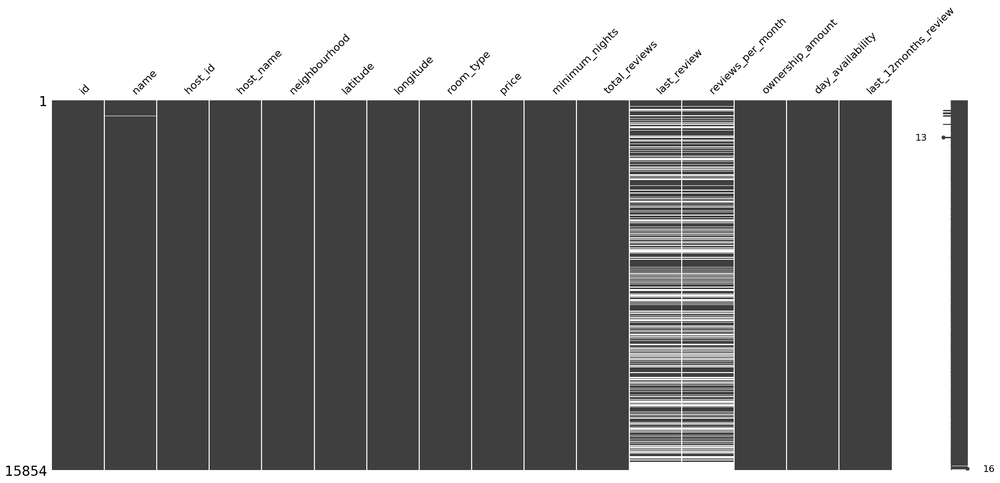

In [12]:
ms.matrix(df)

<Axes: >

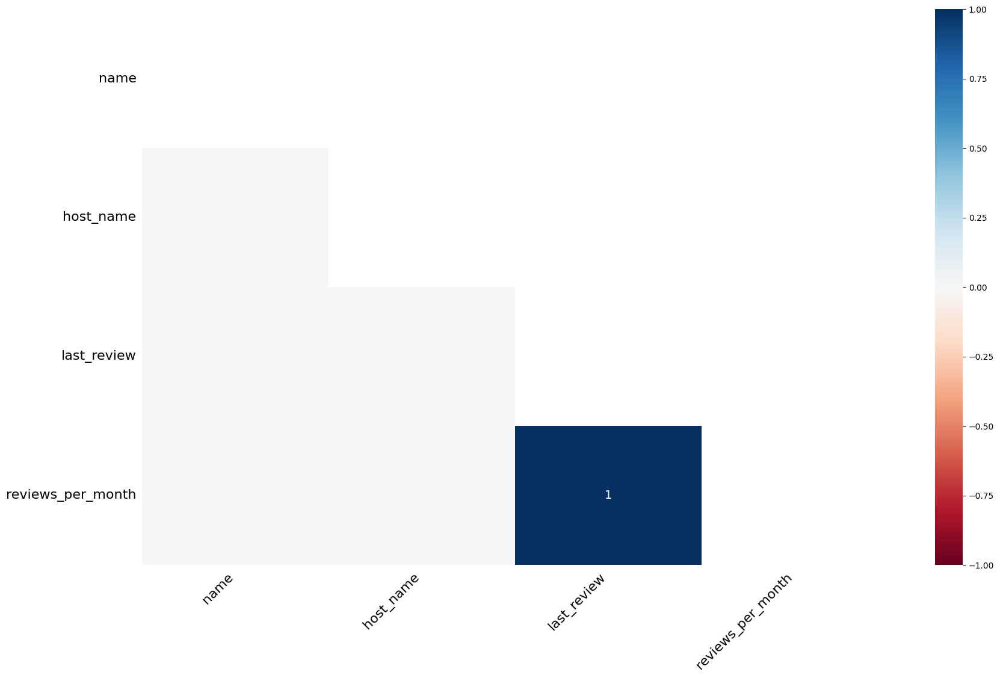

In [13]:
ms.heatmap(df)

Secara garis besar:
* Terdapat missing value pada 4 variabel yaitu `name`, `host_name`, `last_review`, `reviews_per_month` dimana jika `last_review` bernilai kosong maka variabel `reviews_per_month` hal ini menandakan bahwa missing valuenya bertipe MAR (Missing At Random).
* *missing value* di kolom `last_review`, `reviews_per_month` memiliki proporsi yang cukup tinggi (>10%), dengan missing value di kedua kolom mencapai 36.52%.
* *missing value* di kolom `name` dan `host_name` dapat dikaitkan dengan kolom `host_id` yang tidak memiliki data kosong sehingga dapat dicari nilai kosongnya.

Kita sudah melihat gambaran kasar missing data di dalam masing masing variabel. Selanjutnya identifikasi missing value di masing masing variabel dan mengatasinya  

#### Missing value pada variabel `name` dan `host_name`


**Variabel host_name**

In [14]:
df.loc[df['host_name'].isna()]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,total_reviews,last_review,reviews_per_month,ownership_amount,day_availability,last_12months_review
3571,19682464,Cozy Hideaway,137488762,NaN,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


pada variabel `host_name` terdapat 1 missing value, dimana dapat dicari jika terdapat host_id yang sama atau name yang sama dengan data missing value.

In [15]:
# cek apakah ada host id yang sama
df.loc[df['host_id']==137488762]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,total_reviews,last_review,reviews_per_month,ownership_amount,day_availability,last_12months_review
3571,19682464,Cozy Hideaway,137488762,NaN,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


In [16]:
# cek apakah ada name yang sama
df.loc[df['name']=="Cozy Hideaway"]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,total_reviews,last_review,reviews_per_month,ownership_amount,day_availability,last_12months_review
3571,19682464,Cozy Hideaway,137488762,NaN,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


karena tidak ada informasi yang didapat maka kolom `host_name` memiliki missing value bertipe MCAR. sehinga akan kita isikan dengan nilai 'unknown'

**Variabel name**

In [17]:
df.loc[df['name'].isna()]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,total_reviews,last_review,reviews_per_month,ownership_amount,day_availability,last_12months_review
439,4549768,NaN,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,NaT,NaN,1,365,0
544,4720818,NaN,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,NaT,NaN,1,365,0
572,4245018,NaN,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,NaT,NaN,1,365,0
669,6148415,NaN,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,NaT,NaN,1,365,0
1030,8055144,NaN,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,NaT,NaN,1,365,0
1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,0.07,1,365,0
1594,10710165,NaN,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,NaT,NaN,1,365,0
2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


pada variabel `name` terdapat 8 missing value, dimana dapat dicari jika terdapat host_id yang sama atau name yang sama dengan data missing value.

In [18]:
#cek jika ada yang memiliki host_id yang sama
df.loc[df['host_id'].isin([18852579,24386225,22030043,31895202,42521288,51374914,55347997,73275200])]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,total_reviews,last_review,reviews_per_month,ownership_amount,day_availability,last_12months_review
439,4549768,NaN,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,NaT,NaN,1,365,0
544,4720818,NaN,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,NaT,NaN,1,365,0
572,4245018,NaN,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,NaT,NaN,1,365,0
669,6148415,NaN,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,NaT,NaN,1,365,0
1030,8055144,NaN,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,NaT,NaN,1,365,0
1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,0.07,1,365,0
1594,10710165,NaN,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,NaT,NaN,1,365,0
1981,13400326,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72427,100.56443,Private room,950,1,1,2020-02-19,0.03,3,1,0
1982,13400758,Errday Guest House,73275200,Pakaphol,Khlong Toei,13.72373,100.56415,Private room,36363,1,0,NaT,NaN,3,1,0
2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


Terdapat host_id dan host_name yang sama dengan missing data, maka missing valuenya bertipe MCAR, dan bisa diinputkan berdasarkan data pengamatan lain.

In [19]:
#inputasi kolom name berdasarkan kolom host_id yang sama
df.loc[2075,'name']="Errday Guest House"

Dari analisis di atas, kita sudah tau bahwa sisa *missing value* kolom `name` dan `host_name` yang tersisa adalah MCAR. Maka, kita memutuskan mengisikan *missing value* kedua kolom ini dengan unknown.  

In [20]:
df['name'] = df['name'].fillna('unknown')
df['host_name'] = df['host_name'].fillna('unknown')

In [21]:
df[['name','host_name']].isna().sum()

name         0
host_name    0
dtype: int64

Sekarang, data kosong sudah tidak ada pada variabel `name` dan `host_name`.

#### Missing value pada variabel `last_review` dan `reviews_per_month`
Selanjutnya, mari kita cek kolom `last_review` dan `reviews_per_month`. Kedua kolom ini tentunya saling berhubungan dengan total_reviews, dengan kolom `last_review` memiliki *missing value* sebanyak 36,52% (5790) dan `reviews_per_month` 36,52% (5790).



In [22]:
df[['last_review','reviews_per_month']].isna().sum()

last_review          5790
reviews_per_month    5790
dtype: int64

Pertama, mari kita cek kolom `number_of_reviews` dari data dengan kolom `last_review` yang kosong.

In [23]:
df[df['last_review'].isna()]['total_reviews'].value_counts()

total_reviews
0    5790
Name: count, dtype: int64

Bisa dilihat bahwa pada semua data yang kosong di kolom `last_review` memiliki data `number_of_reviews` 0. Kita bisa mengisi data kosong di kolom `last_review` dengan nilai 'not available'.

In [24]:
# mengisi data kosong di kolom `major_discipline` yang berisi 'High School' dan 'Primary School' di kolom `education_level` dengan 'not available'
df.loc[(df['last_review'].isna())&(df['total_reviews']==0),'last_review']='Not Yet Reviewed'

In [25]:
#cek sisa data kosong
df['last_review'].isna().sum()

0

In [26]:
df['last_review']

0        2020-01-06 00:00:00
1           Not Yet Reviewed
2           Not Yet Reviewed
3        2022-04-01 00:00:00
4           Not Yet Reviewed
                ...         
15849       Not Yet Reviewed
15850       Not Yet Reviewed
15851       Not Yet Reviewed
15852       Not Yet Reviewed
15853       Not Yet Reviewed
Name: last_review, Length: 15854, dtype: object

selanjutnya kita cek kolom `number_of_reviews` dari data dengan kolom `reviews_per_month` yang kosong.

In [27]:
df[df['reviews_per_month'].isna()]['total_reviews'].value_counts()

total_reviews
0    5790
Name: count, dtype: int64

Bisa dilihat bahwa pada semua data yang kosong di kolom `reviews_per_month` memiliki data `number_of_reviews` 0. Kita bisa mengisi data kosong di kolom `reviews_per_month` dengan nilai 0.

In [28]:
# mengisi data kosong di kolom `major_discipline` yang berisi 'High School' dan 'Primary School' di kolom `education_level` dengan 'not available'
df.loc[(df['reviews_per_month'].isna())&(df['total_reviews']==0),'reviews_per_month']=0

In [29]:
#cek sisa data kosong
df['reviews_per_month'].isna().sum()

0

Setelah pengisian di atas, sudah tidak ada data kosong yang tersisa di kolom `last_review` dan `reviews_per_month`.

### Data Duplikat

In [30]:
df.duplicated().sum()

0

In [31]:
df.drop(columns="id").duplicated().sum()

7

In [32]:
df.loc[df.drop(columns="id").duplicated(keep=False)]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,total_reviews,last_review,reviews_per_month,ownership_amount,day_availability,last_12months_review
5890,28831409,NA BANGLAMPOO GUEST HOUSE,87704107,Yui,Phra Nakhon,13.762790,100.497900,Private room,1400,1,0,Not Yet Reviewed,0.0,9,361,0
5976,28907857,NA BANGLAMPOO GUEST HOUSE,87704107,Yui,Phra Nakhon,13.762790,100.497900,Private room,1400,1,0,Not Yet Reviewed,0.0,9,361,0
8789,37953702,small1,97598307,Soo,Don Mueang,13.920720,100.575780,Shared room,350,1,0,Not Yet Reviewed,0.0,4,180,0
8790,37954129,small1,97598307,Soo,Don Mueang,13.920720,100.575780,Shared room,350,1,0,Not Yet Reviewed,0.0,4,180,0
15183,765632824291529126,Sathon Luxury 2 br/China Town/Icon Siam,264864968,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,Not Yet Reviewed,0.0,44,340,0
15186,765691389894680033,Sathon Luxury 2 br/China Town/Icon Siam,264864968,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,Not Yet Reviewed,0.0,44,340,0
15190,765716244664642439,Sathon Luxury 2 br/China Town/Icon Siam,344327171,Alice,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,Not Yet Reviewed,0.0,40,340,0
15191,765721954905526928,Sathon Luxury 2 br/China Town/Icon Siam,344327171,Alice,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,Not Yet Reviewed,0.0,40,340,0
15549,781507744450884041,Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9,20133201,Willam,Huai Khwang,13.756184,100.568269,Entire home/apt,2533,3,0,Not Yet Reviewed,0.0,33,360,0
15550,781514912980696908,Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9,20133201,Willam,Huai Khwang,13.756184,100.568269,Entire home/apt,2533,3,0,Not Yet Reviewed,0.0,33,360,0


In [33]:
host_id_duplikat = df.loc[df.drop(columns="id").duplicated(keep=False),'host_id'].unique()
host_id_duplikat

array([ 87704107,  97598307, 264864968, 344327171,  20133201, 340188343])

In [34]:
for id in host_id_duplikat:
  if df.loc[df['host_id']==id,'id'].count() == df.loc[df['host_id']==id,'ownership_amount'].mean():
    continue
  else:
    print(f"Ada duplikat pada host_id : {id}")

Karena jumlah properti yang dimiliki sama dengan nilai variabel ownership amount maka ini mengindikasikan tidak ada duplikat, memang ada properti yang berbeda namun dengan lokasi yang berdekatan.

In [35]:
#df = df.drop(columns="id").drop_duplicated()
#df

### Data Outlier

In [36]:
df_num = df.select_dtypes('number').drop(columns=["id","host_id","latitude","longitude"])
df_num.head()

,price,minimum_nights,total_reviews,reviews_per_month,ownership_amount,day_availability,last_12months_review
0,1905,3,65,0.50,2,353,0
1,1316,1,0,0.00,2,358,0
2,800,60,0,0.00,1,365,0
3,1286,7,2,0.03,1,323,1
4,1905,1,0,0.00,3,365,0


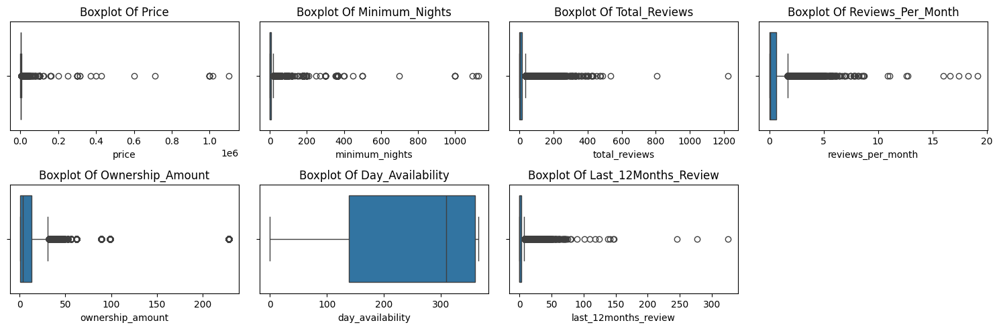

In [37]:
plt.figure(figsize = (15, 7))

for idx, col in enumerate(df_num.columns) :
  box = sns.boxplot(x=df[col], ax = plt.subplot(3, 4, idx + 1))
  box.set_title(f'Boxplot of {col}'.title())

plt.tight_layout()
plt.show()

Terdapat data outlier disetiap variabel numerik kecuali variabel Day_Availability.
- Variabel `total_review`, `review_per_month`, `last_12Months_review` terdapat outlier karena adanya properti yang belum pernah direview (bernilai 0). Sehingga untuk mengatasi hal ini maka data akan dibagi menjadi properti yang telah direview dan belum direview.  
- Variabel `minimum_night` akan diatasi nilai outliernya dengan mengelompokan menjadi sewa harian (0-7), mingguan (8-30), bulanan(31-365), dan tahunan (>365)
- Variabel `price` akan dilakukan pengelompokan harga dengan 3 kelas interval (murah, sedang, mahal)
- Variabel `ownership_amount` akan dibiarkan karena hanya digunakan untuk menunjukkan berapa banyak properti yang dimiliki pemilik pada analisis.

### Extract and Transform Feature

- Variabel note

In [38]:
df['note'] = df['total_reviews'].apply(lambda x:"Not Yet Reviewed" if x == 0 else "Has Been Reviewed")
df.head(3)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,total_reviews,last_review,reviews_per_month,ownership_amount,day_availability,last_12months_review,note
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06 00:00:00,0.5,2,353,0,Has Been Reviewed
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,Not Yet Reviewed,0.0,2,358,0,Not Yet Reviewed
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,Not Yet Reviewed,0.0,1,365,0,Not Yet Reviewed


- Variabel rental length

In [39]:
def rental_length (x):
  if x>=0 and x<=7:
    y="Daily"
  elif x>=8 and x<=30:
    y="Weekly"
  elif x>=31 and x<=365:
    y="Monthly"
  elif x>365:
    y="Yearly"
  return y

df['rental_length'] = df['minimum_nights'].apply(rental_length)
df.head(3)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,total_reviews,last_review,reviews_per_month,ownership_amount,day_availability,last_12months_review,note,rental_length
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06 00:00:00,0.5,2,353,0,Has Been Reviewed,Daily
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,Not Yet Reviewed,0.0,2,358,0,Not Yet Reviewed,Daily
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,Not Yet Reviewed,0.0,1,365,0,Not Yet Reviewed,Monthly


- Variabel Cost

In [40]:
df['cost'] = pd.cut(df['price'],3,labels=['Cheap Price', 'Medium Price', 'Expensive Price'])
df.head(3)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,total_reviews,last_review,reviews_per_month,ownership_amount,day_availability,last_12months_review,note,rental_length,cost
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06 00:00:00,0.5,2,353,0,Has Been Reviewed,Daily,Cheap Price
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,Not Yet Reviewed,0.0,2,358,0,Not Yet Reviewed,Daily,Cheap Price
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,Not Yet Reviewed,0.0,1,365,0,Not Yet Reviewed,Monthly,Cheap Price


## Data yang sudah bersih
Kita sudah selesai membersihkan data kita, sekarang, mari kita lihat sekilas informasi dari data yang sudah kita bersihkan

In [41]:
pd.set_option('display.max_colwidth', None)
# data uni di tiap kolom
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(),
                    df[col].nunique(), df[col].unique()])

tabel1Desc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'unique', 'uniqueSample'],
                     data=listItem)
tabel1Desc

,dataFeatures,dataType,null,unique,uniqueSample
0,id,int64,0,15854,"[27934, 27979, 28745, 35780, 941865, 1704776, 48736, 1738669, 1744248, 952677, 55681, 1765918, 55686, 59221, 959254, 62217, 1791481, 66046, 105042, 1793000, 960858, 113744, 965722, 1808600, 118118, 1816517, 969792, 121410, 145343, 973830, 156583, 1823321, 159854, 976690, 978531, 166267, 169285, 978969, 1842066, 169514, 1849029, 1862089, 985743, 988373, 172332, 1016487, 1862331, 1862377, 185364, 1887544, 1888303, 1019241, 241416, 1026451, 1028469, 1028486, 1035589, 1035640, 1897982, 296960, 1898332, 1041976, 313459, 1052180, 1926489, 320014, 1933894, 1057173, 1060320, 384924, 1067748, 1077493, 1943048, 385130, 385278, 385979, 390611, 1947314, 1079039, 1086843, 393066, 397449, 405662, 1088343, 1094136, 1961981, 407381, 1975849, 1133843, 413824, 428360, 428421, 428907, 428950, 430691, 430703, 430706, 432004, 439051, 1138679, ...]"
1,name,object,0,14795,"[Nice room with superb city view, Easy going landlord,easy place, modern-style apartment in Bangkok, Spacious one bedroom at The Kris Condo Bldg. 3, Suite Room 3 at MetroPoint, NEw Pro!! Bungalow Bkk Centre, Condo with Chaopraya River View, 1 chic bedroom apartment in BKK, Batcave, Pool view, near Chatuchak, Standard Room Decor do Hostel, Sathorn Terrace Apartment(61), 2BR apt in a cozy neighborhood, Comfy bedroom near River pier & BTS Taksin., budget hotel bangkok near subway, Deluxe Condo, Nana, Pool/GYM/Sauna, Luxury@swimpool/FreeWiFi/nearJJMkt, Nice and Quiet condo near BTS Onnut, 24Flr- 1br Apt near JJ, MRT, BTS, Central Bangkok 3 Bedroom Apartment, The Duplex - Asoke- Luxury 92sqm, New, Stylish & Luxury Studio Condo, River View - Ivy Condo (1 Bedroom), Siamese Gioia on Sukhumvit 31, Contemporary Modern Duplex-Thong Lo, Pan Dao Condo 5 min from BTS On Nut, 1 BR condominium center BKK +NETFLIX+55SQM, 1 penthouse in central Bangkok, MetroPoint Suite Room, Near Airport, Boutique Rooms Near Bangkok Airport, BangLuang House1 @ Bangkok Thailand, Studio near Chula University/Silom walk to MRT/BTS, กรองทองแมนชั่น (ลาดพร้าว 81), Deluxe one Bedroom Condo w.Pool-GYM & Sauna 8-7, Beautiful 1 BR apartment @BTS Ari, Urban Oasis in the heart of Bangkok, 1Bed apt. near Chula University/Silom, Stay at the ROARING RATCHADA!, 60 m2 apartment in Thong Lor, Bangkok, ICONSIAM River view on 49th floor, 2br apt in Sukhumvit Asoke near BTS, Self catering cozy1-bed near BTS, ❂☀☀☀Perfect Escape☀☀☀Sunny Roof EnSuite☀☀☀☀, Room with city view of BKK, BangLuang House 2@ Bangkok Thailand, Tranquility found in busy Bangkok near new skytran, Private room in Bangkok, ☞✪✪✪✪Roomy Studio 4 Family r friends✪No Stairs✪✪✪✪, ☞Downtown Central Studio-Bangkok MRT, Beautiful Wood Bangkok Resort House, ""Serviced 2 Bed Scenic SkyVillas"", Cozy 1BR rooftop (BTS Ploenchit) heart of bangkok, Chic two bedroom for Monthly rental, Sukhumvit52 near SkyTrain to BkkCBD, ♡Chic Studio, Easy Walk to Pier & BTS Taksin♡, One Bedroom Suite- WIFI- SATHORN, STUDIO RM2 - WIFI- SATHORN, Quiet Double Bed Apartment, Quiet Double Bed Apartment, Suvarnabhumi free transfer, Luxury&Comfy wthWifi walk-distance to Subwy-Malls, Apr. for rent full fur 1 bedroom, monthly, Long-stay special rate spacious entire floor Siam, One Bed Room at Sukumvit 50 Bangkok, City View, relaxed theme & delicious food around, Ideo Blucove Sukhumvit Bangkok, 2-BR condo near BTS on Sukhumvit Rd, NewlyRenovated! 3Br,SingleHouse, Park/BTS/Airport., IdeoMix, Sukhumvit RD, close to BTS, Mix Dorm Decor do Hostel, Oasis in the heart of Bangkok, 5 mins by car from Chong Nonsi BTS Station, Inn Saladaeng - Superior hotel room, Best nr Chatujak, MRT, BTS free wifi&fNetflix, ❂Citycenter✔Subway station✔Private Bathroom4Aircon, Nice River View Condominium 30 sq.m, Monthly rent 2Beds/2Baths quiet APT at BTS, Sukhumvit apartment near Nana BTS, A room w/ the view :-) in the city, Spacious 1Bed apartment, Near Bangkok more space than urban!, ✺✺99 feet in the sky✺✺, Cozy Studio Apt near Skytrain.(72/74), Asoke: tasteful, 

In [42]:
df_clean = df.copy()

In [43]:
# from google.colab import files
# df_clean.to_excel('Airbnb Listings Bangkok Clean.xlsx')
# files.download('Airbnb Listings Bangkok Clean.xlsx')

# Data Analysis
Kita sudah melakukan tahap _data cleaning_ dan _data preprocessing_. Sekarang, kita bisa mulai melakukan analisis untuk mencari tahu **bagaimana karakteristik properti yang populer yang di listing pada AirBNB Bangkok**.  


## Variabel Target

- **Variabel Total Reviews**  
Variabel ini menunjukkan kepopuleran properti, dimana semakin banyak total review dapat dikatakan semakin banyak juga pengunjung yang telah menyewa

In [44]:
df['total_reviews'].describe().round(2)

count    15854.00
mean        16.65
std         40.61
min          0.00
25%          0.00
50%          2.00
75%         13.00
max       1224.00
Name: total_reviews, dtype: float64

In [45]:
grup = df.groupby('note')['id'].count()
grup

note
Has Been Reviewed    10064
Not Yet Reviewed      5790
Name: id, dtype: int64

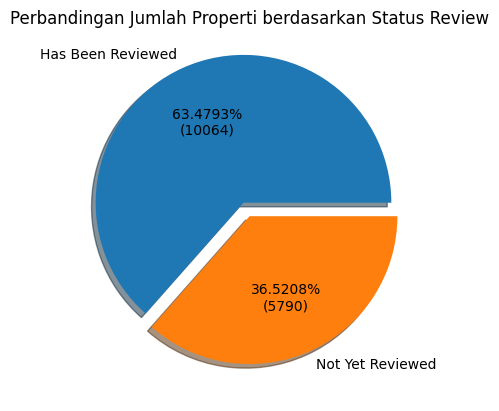

In [46]:
def labelku(x):
    return '{:.4f}%\n({:.0f})'.format(x, len(df)*x/100)

plt.pie(x=grup,labels=grup.index, autopct=labelku, explode=[0.1,0],shadow=True)
plt.title('Perbandingan Jumlah Properti berdasarkan Status Review')
plt.show()

In [47]:
df_review = df.loc[df['total_reviews']>0]

In [48]:
df_review['total_reviews'].describe()

count    10064.000000
mean        26.235592
std         48.446789
min          1.000000
25%          2.000000
50%          8.000000
75%         28.000000
max       1224.000000
Name: total_reviews, dtype: float64

In [49]:
iqr =df_review['total_reviews'].quantile(0.75) -df_review['total_reviews'].quantile(0.25)
b_atas =df_review['total_reviews'].quantile(0.75) + 1.5*iqr
b_bawah = df_review['total_reviews'].quantile(0.25) - 1.5*iqr

Text(0.5, 1.0, 'Persebaran Total Review')

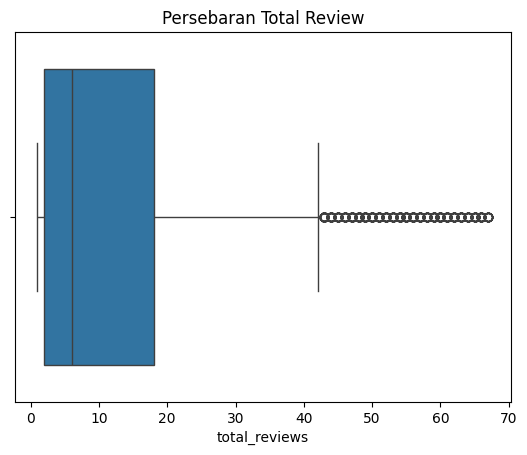

In [50]:
sns.boxplot(data=df_review.loc[(df['total_reviews']>=b_bawah)&(df['total_reviews']<=b_atas)],x='total_reviews')
plt.title('Persebaran Total Review')

Text(0.5, 1.0, 'Persebaran Total Review Berdasarkan Room Type')

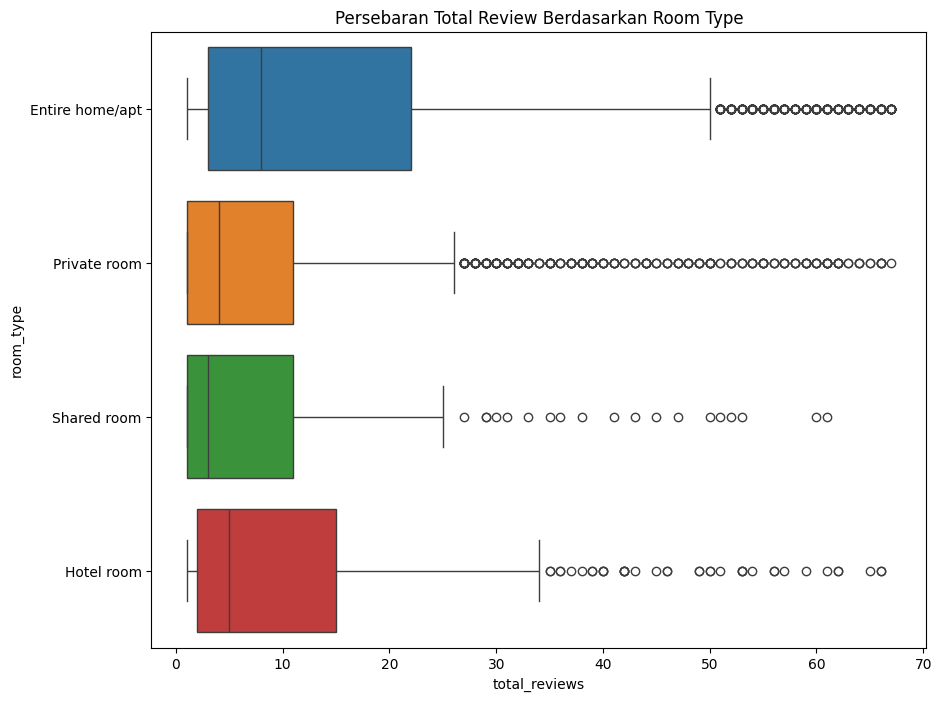

In [51]:
plt.figure(figsize=(10,8))
sns.boxplot(data=df_review.loc[(df['total_reviews']>=b_bawah)&(df['total_reviews']<=b_atas)],x='total_reviews',y='room_type',hue='room_type')
plt.title('Persebaran Total Review Berdasarkan Room Type')

In [52]:
df.groupby('note')['price'].mean()

note
Has Been Reviewed    3099.757452
Not Yet Reviewed     3422.714853
Name: price, dtype: float64

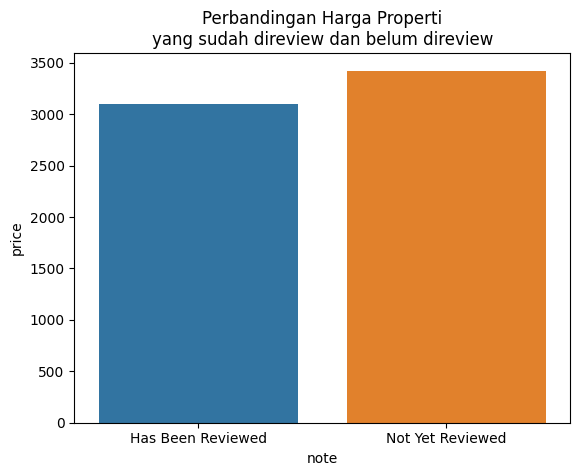

In [53]:
sns.barplot(data=df,x='note',y='price',hue='note',errorbar=None)
plt.title('Perbandingan Harga Properti\nyang sudah direview dan belum direview')
plt.show()

In [54]:
stats, pvalue = mannwhitneyu(df.loc[df['note']=='Has Been Reviewed','price'], df.loc[df['note']=='Not Yet Reviewed','price'],alternative='Less')
pvalue

2.3405707212577563e-08

In [55]:
H0 = "Harga Properti yang Telah Direview lebih mahal atau sama dengan Properti yang Belumh Direview"
Ha = "Harga Properti yang Telah Direview lebih murah daripada Properti yang Belumh Direview"
alpha = 0.05

if pvalue <= 0.05:
    print(f"Karena nilai P-value({round(pvalue, 3)}) < {alpha} maka H0 ditolak, jadi {Ha}")
else:
    print(f"Karena nilai P-value({round(pvalue, 3)}) > {alpha} maka H0 diterima, jadi {H0}")

Karena nilai P-value(0.0) < 0.05 maka H0 ditolak, jadi Harga Properti yang Telah Direview lebih murah daripada Properti yang Belumh Direview


In [56]:
df.groupby('note')['minimum_nights'].mean()

note
Has Been Reviewed    12.913752
Not Yet Reviewed     19.426770
Name: minimum_nights, dtype: float64

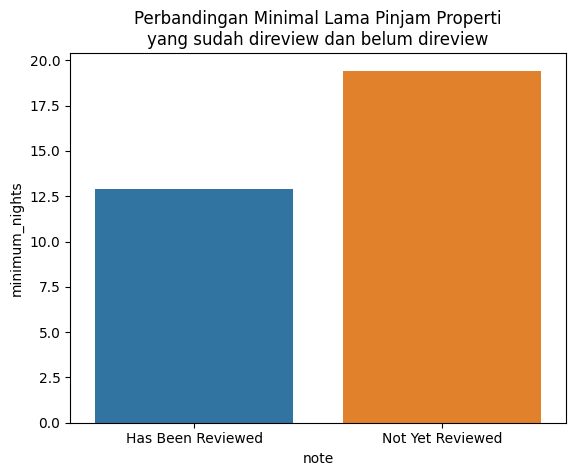

In [57]:
sns.barplot(data=df,x='note',y='minimum_nights',hue='note',errorbar=None)
plt.title('Perbandingan Minimal Lama Pinjam Properti\nyang sudah direview dan belum direview')
plt.show()

In [58]:
stats, pvalue = mannwhitneyu(df.loc[df['note']=='Has Been Reviewed','minimum_nights'], df.loc[df['note']=='Not Yet Reviewed','minimum_nights'])
pvalue

6.097246397504874e-11

In [59]:
H0 = "Minimal Lama Sewa Properti yang Telah Direview sama dengan Properti yang Belumh Direview"
Ha = "Minimal Lama Sewa Properti yang Telah Direview berbeda daripada Properti yang Belum Direview"
alpha = 0.05

if pvalue <= 0.05:
    print(f"Karena nilai P-value({round(pvalue, 3)}) < {alpha} maka H0 ditolak, jadi {Ha}")
else:
    print(f"Karena nilai P-value({round(pvalue, 3)}) > {alpha} maka H0 diterima, jadi {H0}")

Karena nilai P-value(0.0) < 0.05 maka H0 ditolak, jadi Minimal Lama Sewa Properti yang Telah Direview berbeda daripada Properti yang Belum Direview


In [60]:
df.groupby('note')['day_availability'].mean()

note
Has Been Reviewed    230.434420
Not Yet Reviewed     268.616062
Name: day_availability, dtype: float64

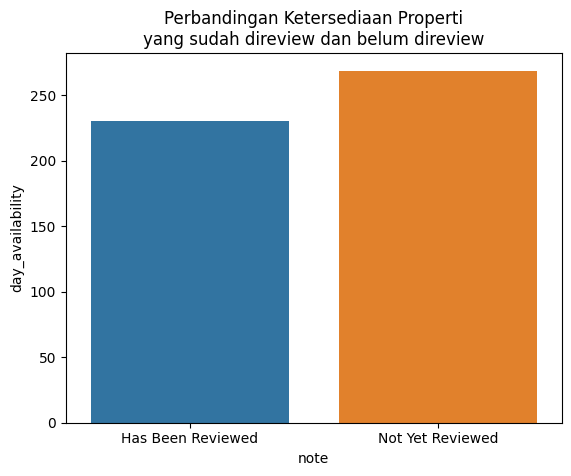

In [61]:
sns.barplot(data=df,x='note',y='day_availability',hue='note',errorbar=None)
plt.title('Perbandingan Ketersediaan Properti\nyang sudah direview dan belum direview')
plt.show()

In [62]:
stats, pvalue = mannwhitneyu(df.loc[df['note']=='Has Been Reviewed','day_availability'], df.loc[df['note']=='Not Yet Reviewed','day_availability'])
pvalue

5.786798779341817e-198

In [63]:
H0 = "Ketersediaan Properti yang Telah Direview sama dengan Properti yang Belumh Direview"
Ha = "Kertersediaan Properti yang Telah Direview berbeda daripada Properti yang Belum Direview"
alpha = 0.05

if pvalue <= 0.05:
    print(f"Karena nilai P-value({round(pvalue, 3)}) < {alpha} maka H0 ditolak, jadi {Ha}")
else:
    print(f"Karena nilai P-value({round(pvalue, 3)}) > {alpha} maka H0 diterima, jadi {H0}")

Karena nilai P-value(0.0) < 0.05 maka H0 ditolak, jadi Kertersediaan Properti yang Telah Direview berbeda daripada Properti yang Belum Direview


- **Variabel Reviews Per Month**  
Variabel ini menunjukkan ke konsitensian properti per bulannya apakah tetap ada yang mereview properti atau tidak. sehingga kita bisa tau bagaimana popularitas properti sepanjang tahun.


In [64]:
df['reviews_per_month'].describe().round(2)

count    15854.00
mean         0.52
std          0.95
min          0.00
25%          0.00
50%          0.09
75%          0.67
max         19.13
Name: reviews_per_month, dtype: float64

In [65]:
df_review['reviews_per_month'].describe().round(2)

count    10064.00
mean         0.81
std          1.09
min          0.01
25%          0.12
50%          0.44
75%          1.06
max         19.13
Name: reviews_per_month, dtype: float64

In [66]:
df_review.loc[df['reviews_per_month']>5,'id'].count()

85

In [67]:
df_review.loc[df['reviews_per_month']>5,'cost'].value_counts()

cost
Cheap Price        85
Medium Price        0
Expensive Price     0
Name: count, dtype: int64

Text(0.5, 1.0, 'Harga Properti dengan Reviews per Month lebih dari 5')

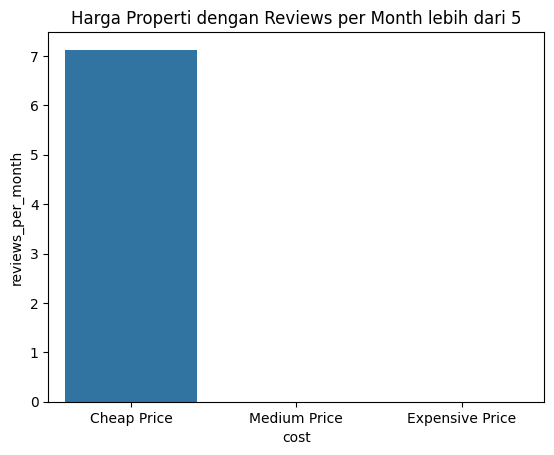

In [68]:
sns.barplot(data = df_review.loc[df['reviews_per_month']>5],x='cost',y='reviews_per_month',errorbar=None)
plt.title('Harga Properti dengan Reviews per Month lebih dari 5')

In [69]:
df_review.loc[df['reviews_per_month']>5,'rental_length'].value_counts()

rental_length
Daily     84
Weekly     1
Name: count, dtype: int64

Text(0.5, 1.0, 'Lama Sewa Properti dengan Reviews per Month lebih dari 5')

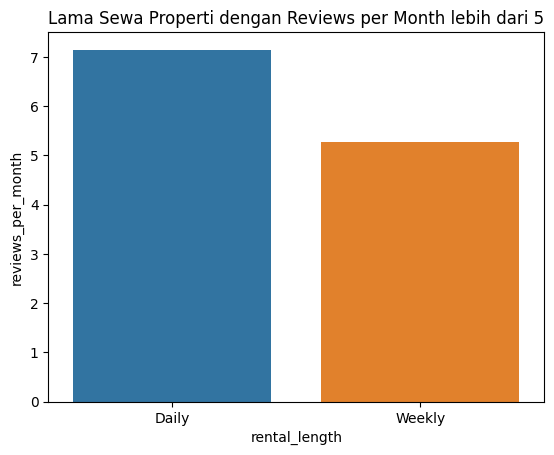

In [70]:
sns.barplot(data = df_review.loc[df['reviews_per_month']>5],x='rental_length',y='reviews_per_month',hue='rental_length',errorbar=None)
plt.title('Lama Sewa Properti dengan Reviews per Month lebih dari 5')

In [71]:
df_review.loc[df['reviews_per_month']>5,'room_type'].value_counts()

room_type
Entire home/apt    68
Private room       14
Hotel room          3
Name: count, dtype: int64

Text(0.5, 1.0, 'Tipe Properti dengan Reviews per Month lebih dari 5')

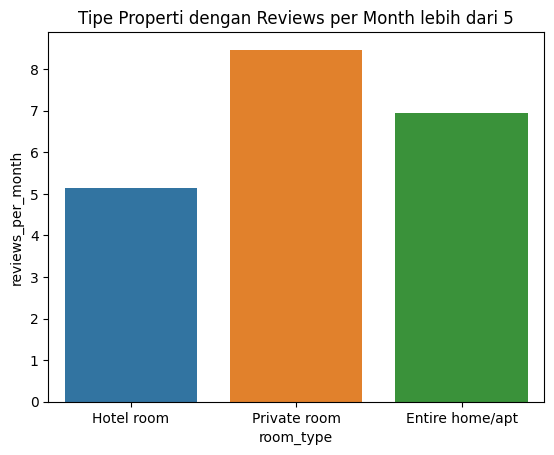

In [72]:
sns.barplot(data = df_review.loc[df['reviews_per_month']>5],x='room_type',y='reviews_per_month',hue='room_type',errorbar=None)
plt.title('Tipe Properti dengan Reviews per Month lebih dari 5')

- **Variabel Last 12 Month Review**  
Variabel ini menunjukkan popularitas/keaktifan properti dalam 1 tahun kebelakang. Jadi bisa dikatakan bahwa semakin tinggi nilai variabel ini maka properti tersebut masih eksis atau relevan dengan minat penyewa sekarang.

In [73]:
df.loc[df['total_reviews']>0,'last_12months_review'].describe().round(2)

count    10064.00
mean         5.48
std         10.69
min          0.00
25%          0.00
50%          2.00
75%          6.00
max        325.00
Name: last_12months_review, dtype: float64

In [74]:
df_review.loc[df['last_12months_review']>50,'id'].count()

51

In [75]:
df_review.loc[df['last_12months_review']>50,'cost'].value_counts()

cost
Cheap Price        51
Medium Price        0
Expensive Price     0
Name: count, dtype: int64

Text(0.5, 1.0, 'Harga Properti dengan Reviews 12 bulan terakhir lebih dari 50')

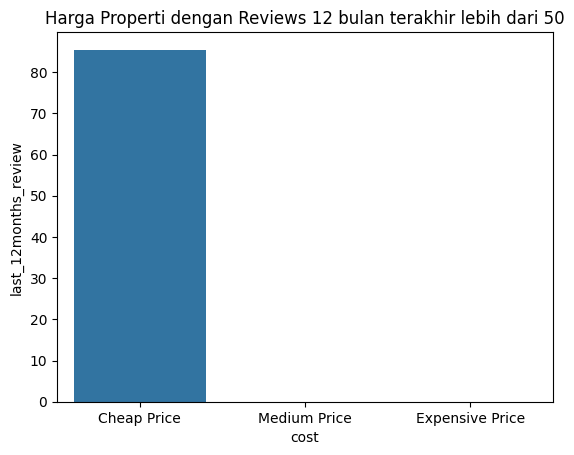

In [76]:
sns.barplot(data = df_review.loc[df['last_12months_review']>50],x='cost',y='last_12months_review',errorbar=None)
plt.title('Harga Properti dengan Reviews 12 bulan terakhir lebih dari 50')

In [77]:
df_review.loc[df['last_12months_review']>50,'rental_length'].value_counts()

rental_length
Daily    51
Name: count, dtype: int64

Text(0.5, 1.0, 'Lama Sewa Properti dengan Reviews 12 bulan terakhir lebih dari 50')

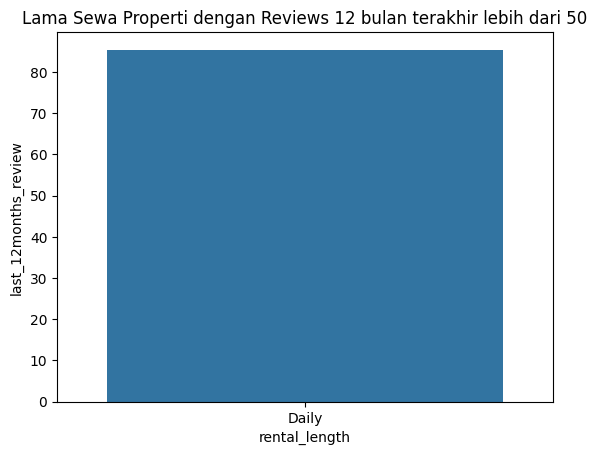

In [78]:
sns.barplot(data = df_review.loc[df['last_12months_review']>50],x='rental_length',y='last_12months_review',errorbar=None)
plt.title('Lama Sewa Properti dengan Reviews 12 bulan terakhir lebih dari 50')

In [79]:
df_review.loc[df['last_12months_review']>50,'room_type'].value_counts()

room_type
Entire home/apt    40
Private room        9
Hotel room          2
Name: count, dtype: int64

Text(0.5, 1.0, 'Jenis Properti dengan Reviews 12 bulan terakhir lebih dari 50')

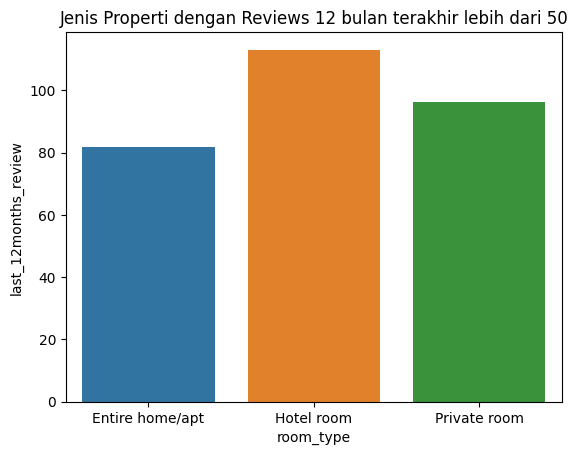

In [80]:
sns.barplot(data = df_review.loc[df['last_12months_review']>50],x='room_type',y='last_12months_review',errorbar=None,hue='room_type')
plt.title('Jenis Properti dengan Reviews 12 bulan terakhir lebih dari 50')

## Korelasi variabel numerik dengan variabel target

In [81]:
df_review = df.loc[df['total_reviews']>0]

In [82]:
df_num = df_review.select_dtypes('number').drop(columns=["id","host_id","latitude","longitude"])
df_num.head()

,price,minimum_nights,total_reviews,reviews_per_month,ownership_amount,day_availability,last_12months_review
0,1905,3,65,0.50,2,353,0
3,1286,7,2,0.03,1,323,1
5,1000,250,19,0.17,41,365,0
6,1558,3,1,0.01,1,365,0
8,1558,3,10,0.09,1,365,0


### Scaterplot Variabel Numerik dengan variabel target

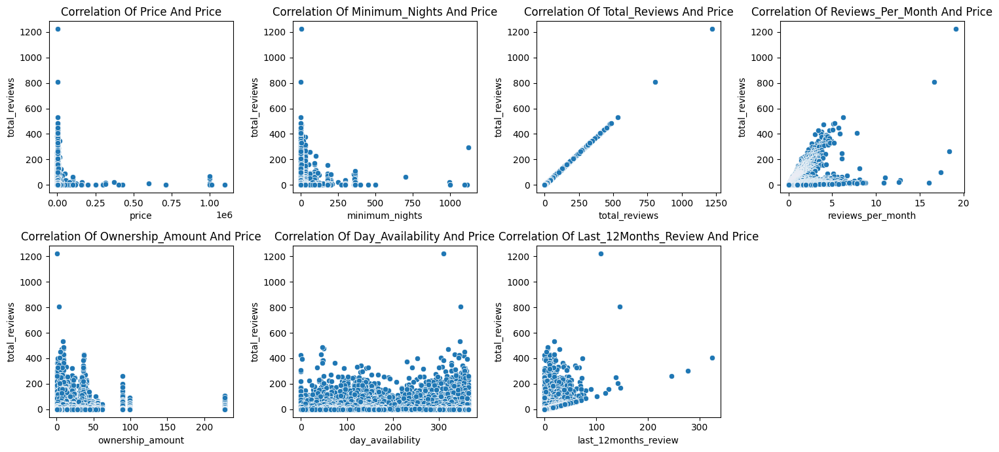

In [83]:
plt.figure(figsize = (15, 7))

for idx, col in enumerate(df_num.columns) :
  scatter = sns.scatterplot(x=df[col], y=df['total_reviews'].round(2), ax = plt.subplot(2, 4, idx + 1))
  scatter.set_title(f'Correlation of {col} and price'.title())

plt.tight_layout()
plt.show()

### Distribusi Variabel Numerik

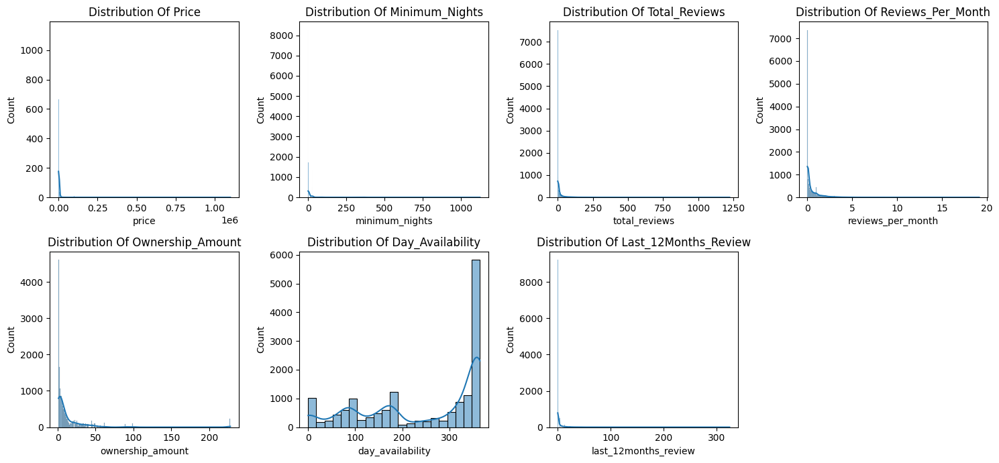

In [84]:
plt.figure(figsize = (15, 7))

for idx, col in enumerate(df_num.columns) :
  hist = sns.histplot(df[col], kde = True, ax = plt.subplot(2, 4, idx + 1))
  hist.set_title(f'Distribution of {col}'.title())

plt.tight_layout()
plt.show()

In [85]:
# cek distribusi kolom city_development_index
from scipy.stats import kstest
for col in df_num.columns :
  stats, pval = kstest('norm', df[col])
  if pval<=0.05:
      print(f'variabel {col} tidak berdistribusi normal') #Ha
  else:
      print(f'variabel {col} berdistribusi normal') #Ho

variabel price tidak berdistribusi normal
variabel minimum_nights tidak berdistribusi normal
variabel total_reviews tidak berdistribusi normal
variabel reviews_per_month tidak berdistribusi normal
variabel ownership_amount tidak berdistribusi normal
variabel day_availability tidak berdistribusi normal
variabel last_12months_review tidak berdistribusi normal


### Korelasi Shapiro Variabel Numerik dengan target

In [86]:
for col in df_num.drop(columns=['total_reviews','reviews_per_month','last_12months_review']).columns:
  r = df[['total_reviews', col]].corr(method='spearman').iloc[0,1]
  print(f"Korelasi Variabel {col} dengan variabel number_of_reviews adalah {r}")

Korelasi Variabel price dengan variabel number_of_reviews adalah -0.02065908969363271
Korelasi Variabel minimum_nights dengan variabel number_of_reviews adalah 0.036322543534481215
Korelasi Variabel ownership_amount dengan variabel number_of_reviews adalah 0.2211423326158468
Korelasi Variabel day_availability dengan variabel number_of_reviews adalah -0.26404412920220355


In [87]:
for col in df_num.drop(columns=['total_reviews','reviews_per_month','last_12months_review']).columns:
  r = df[['reviews_per_month', col]].corr(method='spearman').iloc[0,1]
  print(f"Korelasi Variabel {col} dengan variabel number_of_reviews adalah {r}")

Korelasi Variabel price dengan variabel number_of_reviews adalah 0.017221423434684198
Korelasi Variabel minimum_nights dengan variabel number_of_reviews adalah 0.019226670710891777
Korelasi Variabel ownership_amount dengan variabel number_of_reviews adalah 0.28486330333630244
Korelasi Variabel day_availability dengan variabel number_of_reviews adalah -0.2519462601303312


In [88]:
for col in df_num.drop(columns=['total_reviews','reviews_per_month','last_12months_review']).columns:
  r = df[['last_12months_review', col]].corr(method='spearman').iloc[0,1]
  print(f"Korelasi Variabel {col} dengan variabel number_of_reviews adalah {r}")

Korelasi Variabel price dengan variabel number_of_reviews adalah 0.043726302776602284
Korelasi Variabel minimum_nights dengan variabel number_of_reviews adalah 0.012732793760735777
Korelasi Variabel ownership_amount dengan variabel number_of_reviews adalah 0.27646223890190175
Korelasi Variabel day_availability dengan variabel number_of_reviews adalah -0.21287378473061364


## Persebaran unit AirBNB di bangkok berdasarkan kolom neighbourhood

In [89]:
df_ct=pd.crosstab(df['neighbourhood'],df['room_type'])
df_ct['Total']=df_ct.sum(axis=1)
df_ct.sort_values('Total',ascending=False).head(10)

room_type,Entire home/apt,Hotel room,Private room,Shared room,Total
neighbourhood,,,,,
Vadhana,1451,105,544,53,2153
Khlong Toei,1520,73,489,15,2097
Huai Khwang,776,25,301,23,1125
Ratchathewi,656,70,327,61,1114
Bang Rak,351,67,375,34,827
Sathon,557,15,220,17,809
Phra Nakhon,56,77,355,131,619
Phra Khanong,336,9,201,12,558
Chatu Chak,273,2,266,7,548


Lokasi di bangkok yang memiliki banyak unit airbnb adalah daerah pariwisata sehingga banyak turis yang berkunjung sehingga lebih banyak orang yang menyewa tempat untuk menginap

## Perbandingan total_reviews unit AirBNB berdasarkan neighbourhood dan room type

In [90]:
df_ct=pd.crosstab(df['neighbourhood'],df['room_type'],values=df['total_reviews'],aggfunc=np.mean).round(2)
df_ct['Rata-rata']=df_ct.mean(axis=1).round(2)
df_ct.sort_values('Rata-rata',ascending=False).head(10)

room_type,Entire home/apt,Hotel room,Private room,Shared room,Rata-rata
neighbourhood,,,,,
Pom Prap Sattru Phai,41.61,21.64,29.78,11.60,26.16
Phaya Thai,50.52,23.62,15.68,12.37,25.55
Khlong Toei,22.62,58.21,5.38,1.73,21.98
Lat Krabang,18.67,45.71,15.94,2.88,20.80
Suanluang,16.64,54.00,2.79,8.40,20.46
Sathon,35.13,21.93,9.88,10.24,19.29
Dusit,52.25,NaN,2.45,1.00,18.57
Ratchathewi,21.34,30.97,12.22,8.79,18.33
Bang Rak,38.75,11.03,8.18,7.24,16.30


In [91]:
df_ct.sort_values('Rata-rata').head(10)

room_type,Entire home/apt,Hotel room,Private room,Shared room,Rata-rata
neighbourhood,,,,,
Nong Khaem,0.00,NaN,0.14,NaN,0.07
Bang Bon,0.50,NaN,0.00,NaN,0.25
Nong Chok,0.38,NaN,0.17,NaN,0.28
Sai Mai,0.17,NaN,0.86,NaN,0.52
Taling Chan,0.67,NaN,1.00,1.0,0.89
Thawi Watthana,0.80,NaN,1.00,NaN,0.90
Thung khru,0.78,NaN,1.07,NaN,0.92
Wang Thong Lang,2.36,NaN,1.25,0.0,1.20
Khlong Sam Wa,1.15,NaN,1.58,NaN,1.36


Folium Map

In [92]:
import folium

In [93]:
import json
with open("Bangkok-districts.geojson") as fo:
  data_str = fo.read()
data = json.loads(data_str)
# data


In [94]:
df.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,total_reviews,last_review,reviews_per_month,ownership_amount,day_availability,last_12months_review,note,rental_length,cost
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06 00:00:00,0.50,2,353,0,Has Been Reviewed,Daily,Cheap Price
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,Not Yet Reviewed,0.00,2,358,0,Not Yet Reviewed,Daily,Cheap Price
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,Not Yet Reviewed,0.00,1,365,0,Not Yet Reviewed,Monthly,Cheap Price
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01 00:00:00,0.03,1,323,1,Has Been Reviewed,Daily,Cheap Price
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,Not Yet Reviewed,0.00,3,365,0,Not Yet Reviewed,Daily,Cheap Price


In [116]:
df_district = df.groupby('neighbourhood')[['price','total_reviews','minimum_nights','day_availability']].mean()
df_district['property'] =df.groupby('neighbourhood')['name'].count()
df_district = df_district.reset_index()
df_district.head()

,neighbourhood,price,total_reviews,minimum_nights,day_availability,property
0,Bang Bon,1504.400000,0.200000,3.600000,365.000000,5
1,Bang Kapi,3082.034615,6.984615,14.323077,270.019231,260
2,Bang Khae,1849.739130,1.728261,8.108696,286.586957,92
3,Bang Khen,2194.689655,6.327586,10.517241,264.422414,116
4,Bang Kho laen,2408.114286,18.700000,37.828571,259.478571,140


In [117]:
print('Perbandingan Jumlah Properti Berdasarkan District Bangkok')
bgk_map = folium.Map(location=[13.75058, 100.49258])

bgk_jason = r"Bangkok-districts.geojson"
kel = folium.Choropleth(
    geo_data=bgk_jason,
    data = df_district,
    columns = ["neighbourhood","property"],
    key_on = "feature.properties.dname_e",
    name = "feature.properties.dname_e"
)

kel.add_to(bgk_map)
bgk_map

Perbandingan Jumlah Properti Berdasarkan District Bangkok


In [96]:
print('Perbandingan Rata-Rata Harga Sewa Properti Berdasarkan District Bangkok')
bgk_map = folium.Map(location=[13.75058, 100.49258])

bgk_jason = r"Bangkok-districts.geojson"
kel = folium.Choropleth(
    geo_data=bgk_jason,
    data = df_district,
    columns = ["neighbourhood","price"],
    key_on = "feature.properties.dname_e",
    name = "feature.properties.dname_e"
)

kel.add_to(bgk_map)
bgk_map

Perbandingan Rata-Rata Harga Sewa Properti Berdasarkan District Bangkok


In [112]:
print('Perbandingan Rata-Rata Jumlah Review Properti Berdasarkan District Bangkok')
bgk_map = folium.Map(location=[13.75058, 100.49258])

bgk_jason = r"Bangkok-districts.geojson"
kel = folium.Choropleth(
    geo_data=bgk_jason,
    data = df_district,
    columns = ["neighbourhood","total_reviews"],
    key_on = "feature.properties.dname_e",
    name = "feature.properties.dname_e"
)

kel.add_to(bgk_map)
bgk_map

Perbandingan Rata-Rata Jumlah Review Properti Berdasarkan District Bangkok


In [113]:
print('Perbandingan Rata-Rata Minimal Lama Sewa Properti Berdasarkan District Bangkok')
bgk_map = folium.Map(location=[13.75058, 100.49258])

bgk_jason = r"Bangkok-districts.geojson"
kel = folium.Choropleth(
    geo_data=bgk_jason,
    data = df_district,
    columns = ["neighbourhood","minimum_nights"],
    key_on = "feature.properties.dname_e",
    name = "feature.properties.dname_e"
)

kel.add_to(bgk_map)
bgk_map

Perbandingan Rata-Rata Minimal Lama Sewa Properti Berdasarkan District Bangkok


In [114]:
print('Perbandingan Rata-Rata Ketersediaan Properti Berdasarkan District Bangkok')
bgk_map = folium.Map(location=[13.75058, 100.49258])

bgk_jason = r"Bangkok-districts.geojson"
kel = folium.Choropleth(
    geo_data=bgk_jason,
    data = df_district,
    columns = ["neighbourhood","day_availability"],
    key_on = "feature.properties.dname_e",
    name = "feature.properties.dname_e"
)

kel.add_to(bgk_map)
bgk_map

Perbandingan Rata-Rata Ketersediaan Properti Berdasarkan District Bangkok


## Perbandingan total review sewa berdasarkan jenis unit

In [97]:
grup= df.groupby('room_type')['name'].count().sort_values()
grup

room_type
Shared room         523
Hotel room          649
Private room       5770
Entire home/apt    8912
Name: name, dtype: int64

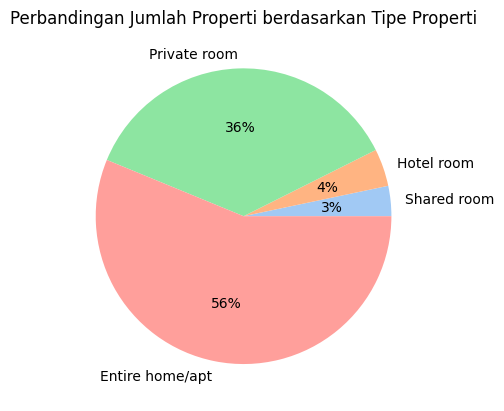

In [98]:
plt.pie(x=grup,labels=grup.index, autopct='%.0f%%',colors=sns.color_palette('pastel'))
plt.title('Perbandingan Jumlah Properti berdasarkan Tipe Properti')
plt.show()

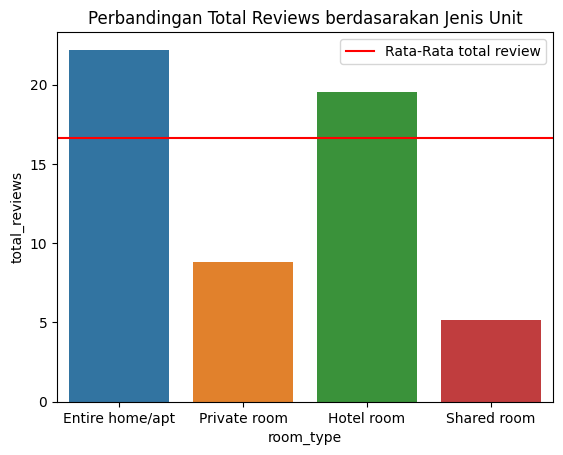

In [99]:
sns.barplot(x=df["room_type"],y=df["total_reviews"].sort_values(ascending=False),errorbar=None,hue=df["room_type"])
plt.title("Perbandingan Total Reviews berdasarakan Jenis Unit")
plt.axhline(y=df["total_reviews"].mean(),color="red",label="Rata-Rata total review")
plt.legend()
plt.show()

## Pemilik Properti dengan toral review properti terbanyak

In [100]:
df_h = df.groupby("host_name").agg({'name':'count','total_reviews' : 'mean'}).round(2).sort_values(by=["name","total_reviews"],ascending=False).rename({'total_reviews':'avg_reviews','name':'total_property'},axis=1)
df_h.loc[df_h['avg_reviews']>20].head(10)

,total_property,avg_reviews
host_name,,
Curry,228,20.65
K,91,32.55
Bee,62,45.53
Alex,62,40.94
Ed,60,46.95
Patty,54,54.24
Tony,50,100.20
Eva,50,26.30
Max,49,59.49


## 10 distrik dengan rata rata harga sewa airbnb tertinggi dan terendah

In [101]:
# 10 kota dengan harga paling mahal
df_n = df.groupby("neighbourhood")[["price"]].mean().reset_index().sort_values(by="price",ascending=False).head(10)
df_n

,neighbourhood,price
7,Bang Phlat,6257.488479
18,Huai Khwang,5036.084444
21,Khlong San,4772.330532
47,Vadhana,4452.131444
29,Parthum Wan,4355.628571
22,Khlong Toei,4249.329995
25,Lat Phrao,3538.596491
5,Bang Khun thain,3404.714286
27,Nong Chok,3279.928571
37,Ratchathewi,3199.271993


<ipython-input-102-246738564a68>:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x=df_n["neighbourhood"],hue=df_n["neighbourhood"],y=df_n["price"],ci=None)


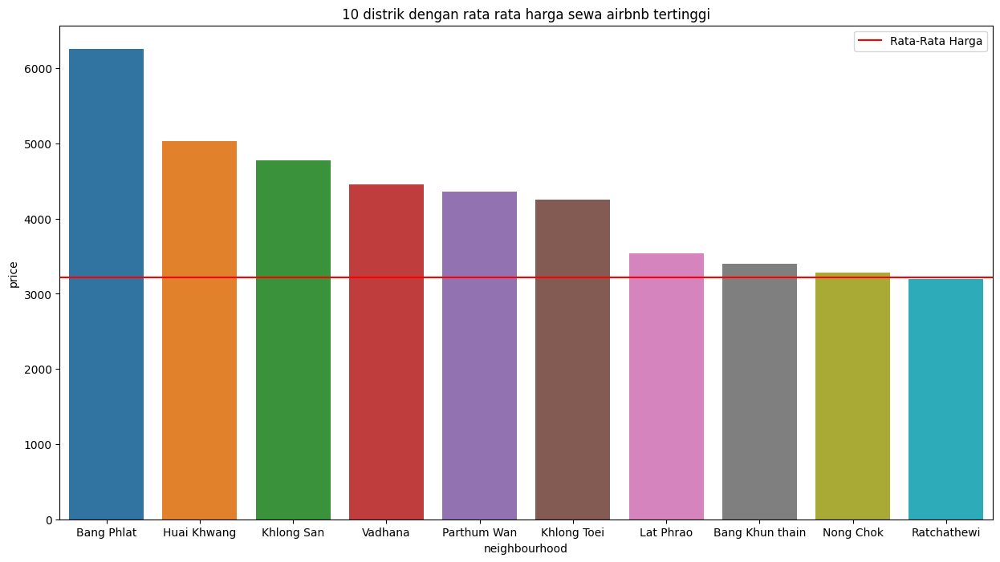

In [102]:
plt.figure(figsize=(15,8))
sns.barplot(x=df_n["neighbourhood"],hue=df_n["neighbourhood"],y=df_n["price"],ci=None)
plt.title("10 distrik dengan rata rata harga sewa airbnb tertinggi")
plt.axhline(y=df["price"].mean(),color="red",label="Rata-Rata Harga")
plt.legend()
plt.show()

In [103]:
# 10 kota dengan harga paling murah
df_n = df.groupby("neighbourhood")[["price"]].mean().reset_index().sort_values(by="price").head(10)
df_n

,neighbourhood,price
23,Lak Si,1143.833333
28,Nong Khaem,1205.222222
16,Don Mueang,1273.910180
24,Lat Krabang,1358.523490
30,Phasi Charoen,1370.219355
26,Min Buri,1379.225806
32,Phra Khanong,1483.254480
0,Bang Bon,1504.400000
36,Rat Burana,1603.245283
48,Wang Thong Lang,1668.430000


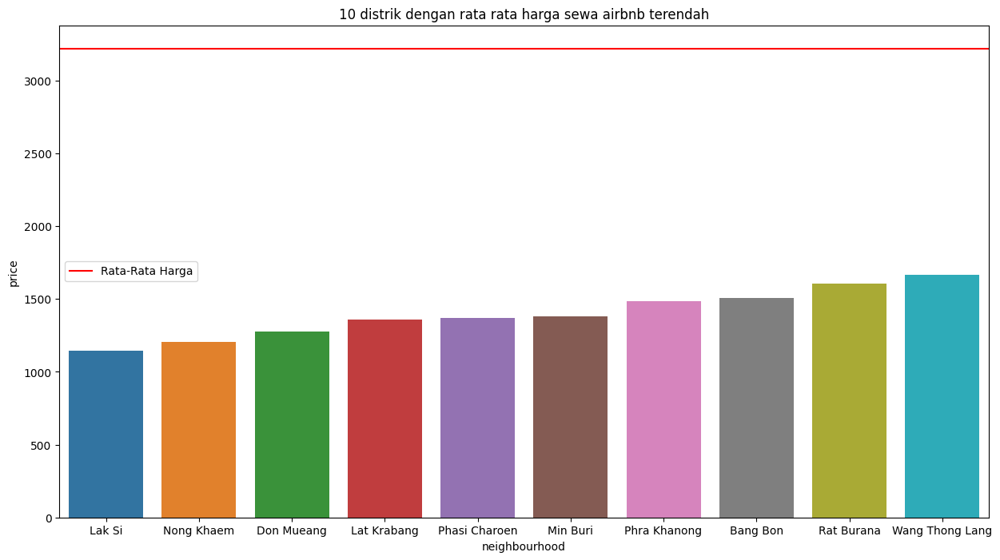

In [104]:
plt.figure(figsize=(15,8))
sns.barplot(x=df_n["neighbourhood"],y=df_n["price"],errorbar=None,hue=df_n["neighbourhood"])
plt.title("10 distrik dengan rata rata harga sewa airbnb terendah")
plt.axhline(y=df["price"].mean(),color="red",label="Rata-Rata Harga")
plt.legend()
plt.show()

## Perbandingan Harga unit dengan jenis unit

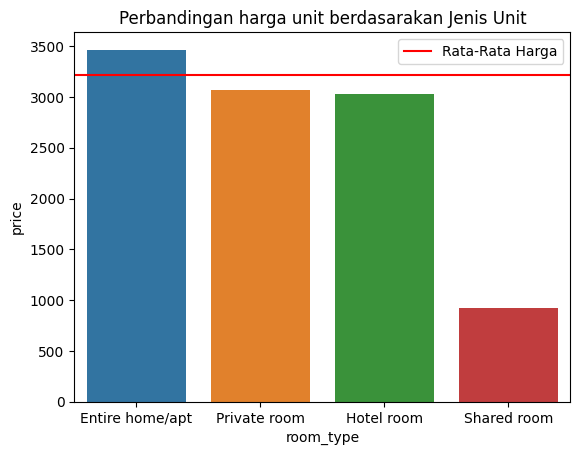

In [105]:
sns.barplot(x=df["room_type"],y=df["price"].sort_values(ascending=False),errorbar=None,hue=df["room_type"])
plt.title("Perbandingan harga unit berdasarakan Jenis Unit")
plt.axhline(y=df["price"].mean(),color="red",label="Rata-Rata Harga")
plt.legend()
plt.show()

## World Cloud nama properti yang populer

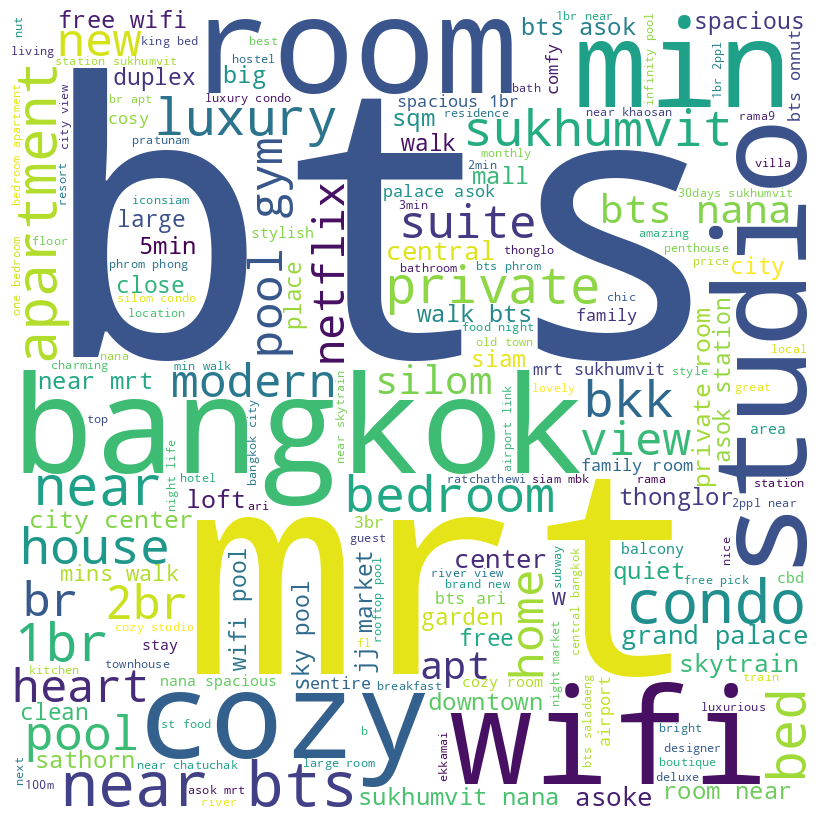

In [106]:
comment_words = ''
stopwords = set(STOPWORDS)

# iterate through the csv file
for val in df.loc[df['total_reviews']>=28,'name']:

    # typecaste each val to string
    val = str(val)

    # split the value
    tokens = val.split()

    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()

    comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)

# plot the WordCloud image
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

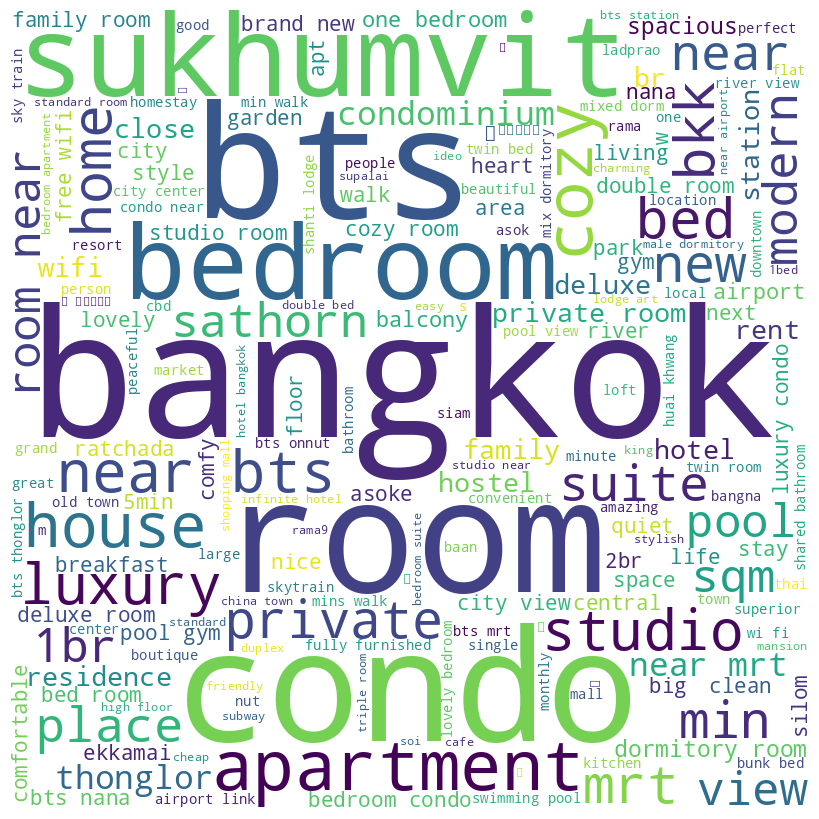

In [107]:
comment_words = ''
stopwords = set(STOPWORDS)

# iterate through the csv file
for val in df.loc[df['total_reviews']==0,'name']:

    # typecaste each val to string
    val = str(val)

    # split the value
    tokens = val.split()

    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()

    comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)

# plot the WordCloud image
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

# Kesimpulan dan Rekomendasi

**Kesimpulan**  
Dari analisis yang telah dilakukan, kita bisa membuat kesilpulan berikut:
- Properti yang telah direview memiliki karakterstik yang berbeda dengan Properti yang belum direview yaitu **harganya lebih murah**, **minimal lama sewa lebih pendek**, dan **ketersediaan harinya yang lebih sedikit** terutama pada **tipe entire home/apt dan hotel**.
- Properti yang konsisten popularitasnya adalah properti dengan nilai `review_per_month` yang tinggi, dan berkarakteristik memiliki harga yang murah, minimal lama sewa dibawah 30 hari dan khusunya tipe private_room
- Properti yang tetap eksis/relevan dengan penyewa sekarang adalah properti dengan nilai `last_12month_review` yang tinggi dimana memiliki karakteristik harga murah, minimal lama sewa dibawah 7 hari terutama pada properti bertipe hotel.




**Rekomendasi**


Rekomendasi untuk para pemilik properti yang ingin atau akan mendaftarkan propertinya ke airbnb disarankan :
- Penentuan harga properti disesuaikan dengan rata-rata harga sewa properti didistrik properti tersebut dan tipe propertinya. Dan disarankan memberikan harga yang lebih murah dari properti lain namun masih tetap diatas rata-rata harga sewa properti di wilayah tersebut.

- Penentuan nama properti yang akan dilisting di aribnb sebaiknya menyematkan kelebihan properti, fitur fitur properti ataupun kata kata promosi.

- Penyesuaian karakteristik properti agar dapat menyesuaikan karakteristik properti yang populer seperti pada kesimpulan yang telah terdaftar di airbnb terlebih dahulu.

- Berkonsultasi pada pemilik properti yang telah terdaftar di airbnb dengan propertinya yang sudah banyak direview, agar dapat memanajemen propertinya menjadi lebih baik.